In [90]:
import pandas as pd
import pypsa

import matplotlib.pyplot as plt
import country_converter as coco

In [91]:
cc = coco.CountryConverter()
historic = pd.read_csv(
    "../resources/validation/historical_cross_border_flows.csv",
    index_col=0,
    header=0,
    parse_dates=True,
)

n = pypsa.Network("../results/validation/networks/elec_s_37_ec_lv1.0_Ept.nc")
n.loads.carrier = "load"

INFO:pypsa.io:Imported network elec_s_37_ec_lv1.0_Ept.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units


In [92]:
len(historic.index)

8759

In [93]:
len(n.snapshots)

8760

In [94]:
if len(historic.index) > len(n.snapshots):
    print("yes")
    historic = historic.resample(n.snapshots.inferred_freq).mean().loc[n.snapshots]

In [95]:
all_country

['AL',
 'AT',
 'BA',
 'BE',
 'BG',
 'CH',
 'CZ',
 'DE',
 'DK',
 'EE',
 'ES',
 'FI',
 'FR',
 'GB',
 'GR',
 'HR',
 'HU',
 'IE',
 'IT',
 'LT',
 'LU',
 'LV',
 'ME',
 'MK',
 'NL',
 'NO',
 'PL',
 'PT',
 'RO',
 'RS',
 'SE',
 'SI',
 'SK']

In [96]:
all_country[:len(all_country)]

['AL',
 'AT',
 'BA',
 'BE',
 'BG',
 'CH',
 'CZ',
 'DE',
 'DK',
 'EE',
 'ES',
 'FI',
 'FR',
 'GB',
 'GR',
 'HR',
 'HU',
 'IE',
 'IT',
 'LT',
 'LU',
 'LV',
 'ME',
 'MK',
 'NL',
 'NO',
 'PL',
 'PT',
 'RO',
 'RS',
 'SE',
 'SI',
 'SK']

In [97]:
all_country = sorted(
    list(
        set(
            [link[:2] for link in historic.columns[1:]]
            + [link[5:] for link in historic.columns[1:]]
        )
    )
)

color_country = {
    "AL": "#440154",
    "AT": "#482677",
    "BA": "#43398e",
    "BE": "#3953a4",
    "BG": "#2c728e",
    "CH": "#228b8d",
    "CZ": "#1f9d8a",
    "DE": "#29af7f",
    "DK": "#3fbc73",
    "EE": "#5ec962",
    "ES": "#84d44b",
    "FI": "#addc30",
    "FR": "#d8e219",
    "GB": "#fde725",
    "GR": "#f0f921",
    "HR": "#f1c25e",
    "HU": "#f4a784",
    "IE": "#f78f98",
    "IT": "#f87ea0",
    "LT": "#f87a9a",
    "LU": "#f57694",
    "LV": "#f3758d",
    "ME": "#f37685",
    "MK": "#f37b7c",
    "NL": "#f28774",
    "NO": "#f1976b",
    "PL": "#efaa63",
    "PT": "#ebb160",
    "RO": "#e6c260",
    "RS": "#e2d75e",
    "SE": "#dedc5b",
    "SI": "#d9e35a",
    "SK": "#d3e75a",
}

In [98]:
optimized_links = n.links_t.p0.rename(
    columns=dict(n.links.bus0.str[:2] + " - " + n.links.bus1.str[:2])
)
optimized_lines = n.lines_t.p0.rename(
    columns=dict(n.lines.bus0.str[:2] + " - " + n.lines.bus1.str[:2])
)
optimized = pd.concat([optimized_links, optimized_lines], axis=1)

# Drop internal country connection
optimized.drop([c for c in optimized.columns if c[:2] == c[5:]], axis=1, inplace=True)

# align columns name
for c1 in optimized.columns:
    for c2 in optimized.columns:
        if c1[:2] == c2[5:] and c2[:2] == c1[5:]:
            optimized = optimized.rename(columns={c1: c2})

optimized = optimized.groupby(lambda x: x, axis=1).sum()

In [99]:
n.links_t.p0

Link,13589,14801,14803,14804+1,14805,14807,14809,14811,14814,14815,...,14824,14825,14826,14848,5580,5581,5586+4,5601,5640,6342
snapshot,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,870.371778,0.0,0.0,0.0,-561.288142,430.308831,-299.997180,337.746474,999.999760,495.575852,...,-221.151605,-808.276887,1999.999855,0.0,245.491078,-1372.933686,-263.327288,-599.996986,89.983643,1095.082216
2019-01-01 01:00:00,900.328684,0.0,0.0,0.0,-557.946421,384.971428,-299.998912,47.451980,999.999704,495.724976,...,-174.278532,400.185124,1999.999835,0.0,245.458980,-1424.206302,-250.399465,-599.998821,113.672912,966.667217
2019-01-01 02:00:00,249.479859,0.0,0.0,0.0,-555.469074,287.488748,-299.998122,-499.857947,999.999802,499.999866,...,-227.621133,1999.999387,1999.999807,0.0,245.681571,22.517291,-268.756712,-599.997887,-300.720028,1999.138024
2019-01-01 03:00:00,173.406139,0.0,0.0,0.0,-554.710286,247.845165,-299.998067,-499.867501,999.999797,499.999852,...,-214.216290,1999.999356,1999.999806,0.0,245.154125,76.431973,-269.658757,-599.997851,-290.866514,1999.119122
2019-01-01 04:00:00,512.746771,0.0,0.0,0.0,-599.999764,14.643768,-299.999742,-499.875012,999.999827,499.999861,...,-599.999792,1999.999354,1999.999807,0.0,245.010824,325.010999,-268.347655,-599.999702,-365.768660,1999.999514
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-31 19:00:00,964.540896,0.0,0.0,0.0,-599.998719,130.517853,-299.998938,-499.945237,-999.964014,494.079192,...,-599.998712,-1999.779134,-1999.957622,0.0,246.815112,-637.668358,-168.008664,-599.998707,-399.552507,610.023175
2019-12-31 20:00:00,943.176424,0.0,0.0,0.0,-599.998739,140.637471,-299.998956,-499.946787,-999.960974,494.510526,...,-599.998725,-1999.757083,-1999.952702,0.0,246.859212,-933.957167,-266.083571,-599.998718,-399.564587,500.412957
2019-12-31 21:00:00,891.839375,0.0,0.0,0.0,-599.998739,142.367339,-299.998947,-499.946061,-999.961649,494.743824,...,-599.998725,-1999.771508,-1999.954008,0.0,246.899460,-1173.869214,-279.810360,-599.998715,-399.589973,423.084363


<AxesSubplot:xlabel='snapshot'>

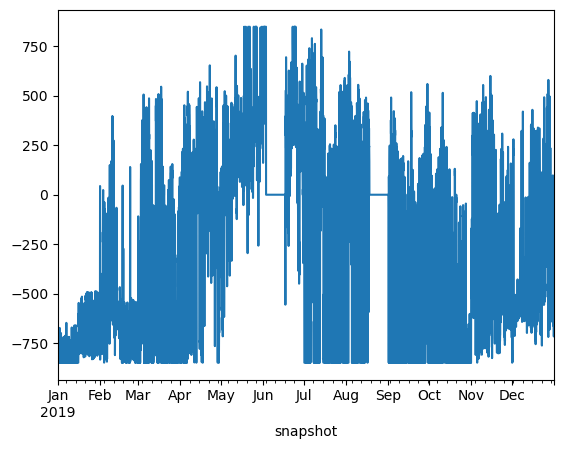

In [100]:
optimized_lines["AL - GR"].plot()

In [101]:
optimized

,AL - GR,AL - ME,AL - RS,AT - CH,AT - CZ,AT - DE,AT - HU,AT - IT,AT - SI,BA - HR,...,ME - RS,MK - RS,NL - DK,NL - NO,NO - SE,PL - LT,PL - SE,PL - SK,RO - RS,SE - DE
snapshot,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,-813.096383,-66.997033,90.122387,-334.350964,-1419.171979,-8021.299854,1219.672105,81.178633,1943.880080,-2052.165490,...,240.784359,467.928300,0.0,699.999990,-3641.983223,1095.082216,-599.286283,-406.491249,66.468906,-599.996986
2019-01-01 01:00:00,-811.913532,-43.007127,118.703771,-276.531718,-920.847903,-8021.300160,1279.971376,96.941098,1943.880414,-1968.762459,...,271.790997,509.340511,0.0,699.999991,-3641.983223,966.667217,-599.378724,-112.249764,45.765885,-599.998821
2019-01-01 02:00:00,-849.050742,60.668165,106.413953,-116.475215,-1646.556117,-8021.299824,1074.504492,231.967757,1943.880461,-1405.800141,...,144.169409,596.183673,0.0,699.999990,-3641.983223,1999.138024,-255.953709,-414.500838,128.114928,-599.997887
2019-01-01 03:00:00,-844.053504,78.823226,118.496218,-116.475168,-1528.699567,-8021.299774,1155.636778,231.967763,1943.880432,-1329.020893,...,149.242187,591.913311,0.0,699.999992,-3641.983223,1999.119122,213.178174,-416.631078,-46.187510,-599.997851
2019-01-01 04:00:00,-817.426801,80.289228,106.080008,-116.475208,-1541.578103,-8021.299854,1174.339425,231.967760,1943.880431,-1264.967180,...,123.853717,555.856044,0.0,699.999992,-3641.983222,1999.999514,599.999543,-389.460141,-88.146056,-599.999702
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-31 19:00:00,-713.851658,290.099523,291.921632,85.639913,-885.808706,-603.158245,433.376797,245.019196,961.062485,-754.941275,...,271.500708,527.375223,0.0,699.999995,-3641.983227,610.023175,599.998734,-862.188345,691.926637,-599.998707
2019-12-31 20:00:00,-716.342449,332.365486,307.162109,-145.346916,-722.802760,-735.107399,330.749333,230.099300,662.441593,-541.766053,...,258.483519,557.564477,0.0,699.999995,-3641.983228,500.412957,599.998735,-954.387792,525.041034,-599.998718
2019-12-31 21:00:00,-692.198580,328.607261,337.861027,-198.431715,-812.230978,-920.845006,343.788051,226.670279,592.900352,-552.218274,...,321.390084,543.064436,0.0,699.999995,-3641.983228,423.084363,599.998733,-937.678575,215.105589,-599.998715


In [150]:
def sort_one_country(country, df):
    indices = [link for link in df.columns if country in link]
    df_country = df[indices].copy()
    for link in df_country.columns:
        if country in link[5:]:
            df_country[link] = -df_country[link]
            link_reverse = str(link[5:] + " - " + link[:2])
            df_country = df_country.rename(columns={link: link_reverse})

    return df_country.reindex(sorted(df_country.columns), axis=1)


def cross_border_time_series(data):
    fig, ax = plt.subplots(2 * len(all_country), 1, figsize=(15, 10 * len(all_country)))
    axis = 0

    for country in all_country:
        ymin = 0
        ymax = 0
        for df in data:
            df_country = sort_one_country(country, df)
            df_neg, df_pos = df_country.clip(upper=0), df_country.clip(lower=0)

            color = [color_country[link[5:]] for link in df_country.columns]

            df_pos.plot.area(
                ax=ax[axis], stacked=True, linewidth=0.0, color=color, ylim=[-1, 1]
            )

            df_neg.plot.area(
                ax=ax[axis], stacked=True, linewidth=0.0, color=color, ylim=[-1, 1]
            )
            if (axis % 2) == 0:
                title = "Historic"
            else:
                title = "Optimized"

            ax[axis].set_title(
                title + " Import / Export for " + cc.convert(country, to="name_short")
            )

            # Custom legend elements
            legend_elements = []

            for link in df_country.columns:
                legend_elements = legend_elements + [
                    plt.fill_between(
                        [],
                        [],
                        color=color_country[link[5:]],
                        label=cc.convert(link[5:], to="name_short"),
                    )
                ]

            # Create the legend
            ax[axis].legend(handles=legend_elements, loc="upper right")

            # rescale the y axis
            neg_min = df_neg.sum(axis=1).min() * 1.2
            if neg_min < ymin:
                ymin = neg_min

            pos_max = df_pos.sum(axis=1).max() * 1.2
            if pos_max < ymax:
                ymax = pos_max

            print(f"{str(len(df_pos))} in {str(axis)}")

            axis = axis + 1

        for x in range(axis - 2, axis):
            ax[x].set_ylim([neg_min, pos_max])

    #fig.savefig(f"trade_time_series/trade_time_series.png", bbox_inches="tight")


def cross_border_bar(data):
    df_positive = pd.DataFrame()
    df_negative = pd.DataFrame()
    color = []

    for country in all_country:
        order = 0
        for df in data:
            if (order % 2) == 0:
                title = "Historic"
            else:
                title = "Optimized"

            df_country = sort_one_country(country, df)
            df_neg, df_pos = df_country.clip(upper=0), df_country.clip(lower=0)
                            
            df_positive_new = pd.DataFrame(data=df_pos.sum()).T.rename(
                {0: title + " " + cc.convert(country, to="name_short")}
            )
            df_negative_new = pd.DataFrame(data=df_neg.sum()).T.rename(
                {0: title + " " + cc.convert(country, to="name_short")}
            )

            df_positive = pd.concat([df_positive_new, df_positive])
            df_negative = pd.concat([df_negative_new, df_negative])

            order = order + 1

    fig, ax = plt.subplots(figsize=(15, 60))
    
    color = [color_country[link[5:]] for link in df_positive.columns] 
    
    df_positive.plot.barh(ax=ax, stacked=True, color=color, zorder=2)
    df_negative.plot.barh(ax=ax, stacked=True, color=color, zorder=2)

    plt.grid(axis="x", zorder=0)
    plt.grid(axis="y", zorder=0)

    # Custom legend elements
    legend_elements = []

    for country in list(color_country.keys()):
        legend_elements = legend_elements + [
            plt.fill_between(
                [],
                [],
                color=color_country[country],
                label=cc.convert(country, to="name_short"),
            )
        ]

    # Create the legend
    plt.legend(handles=legend_elements, loc="upper right")

    #fig.savefig("cross_border_bar.png", bbox_inches="tight")

    # Show the plot
    plt.show()

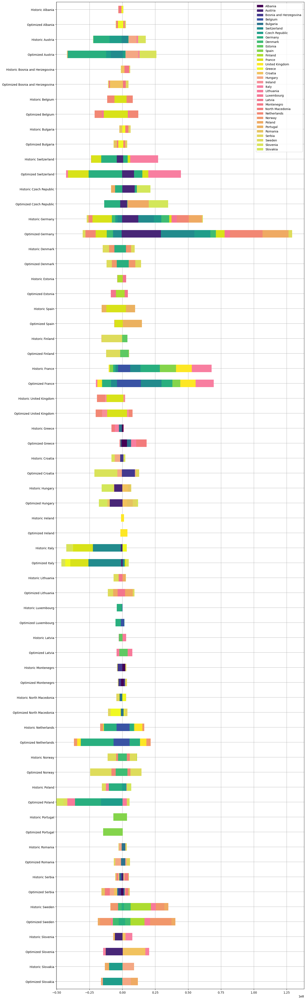

In [151]:
cross_border_bar([historic, optimized])

8759 in 0
8760 in 1
8759 in 2
8760 in 3
8759 in 4
8760 in 5
8759 in 6
8760 in 7
8759 in 8
8760 in 9
8759 in 10
8760 in 11
8759 in 12
8760 in 13
8759 in 14
8760 in 15
8759 in 16
8760 in 17
8759 in 18
8760 in 19
8759 in 20
8760 in 21
8759 in 22
8760 in 23
8759 in 24
8760 in 25
8759 in 26
8760 in 27
8759 in 28
8760 in 29
8759 in 30
8760 in 31
8759 in 32
8760 in 33
8759 in 34
8760 in 35
8759 in 36
8760 in 37
8759 in 38
8760 in 39
8759 in 40
8760 in 41
8759 in 42
8760 in 43
8759 in 44
8760 in 45
8759 in 46
8760 in 47
8759 in 48
8760 in 49
8759 in 50
8760 in 51
8759 in 52
8760 in 53
8759 in 54
8760 in 55
8759 in 56
8760 in 57
8759 in 58
8760 in 59
8759 in 60
8760 in 61
8759 in 62
8760 in 63
8759 in 64
8760 in 65


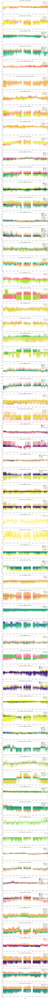

In [12]:
cross_border_time_series([historic, optimized])